In [103]:
%%capture
!pip install cjm_pil_utils cjm_pytorch_utils

In [1]:
# Import necessary modules from the standard library
from pathlib import Path  # For working with file paths
import hashlib  # For generating hash values
import json  # For working with JSON data
import random  # For generating random numbers
import logging  # For logging messages

# Disable logging warnings
logging.disable(logging.WARNING)

from PIL import Image  # For working with images

import numpy as np  # For working with arrays

# Import tqdm module for progress bars
from tqdm.auto import tqdm

# Import pandas module for data manipulation
import pandas as pd

# Set options for Pandas DataFrame display
pd.set_option('max_colwidth', None)  # Do not truncate the contents of cells in the DataFrame
pd.set_option('display.max_rows', None)  # Display all rows in the DataFrame
pd.set_option('display.max_columns', None)  # Display all columns in the DataFrame

In [2]:
from cjm_pil_utils.core import resize_img, get_img_files
from cjm_pytorch_utils.core import pil_to_tensor, tensor_to_pil

In [3]:
import math

In [4]:
import torch  # PyTorch module for deep learning
import torch.nn.functional as F
import torch.utils.checkpoint
from torchvision import transforms  # PyTorch module for image transformations
from torch.utils.data import Dataset

In [5]:
import multiprocessing

In [6]:
#|export
import pickle,gzip,math,os,time,shutil,torch,random
import fastcore.all as fc,matplotlib as mpl,numpy as np,matplotlib.pyplot as plt
from collections.abc import Mapping
from pathlib import Path
from operator import attrgetter,itemgetter
from functools import partial
from copy import copy
from contextlib import contextmanager
# from scipy import linalg

from fastcore.foundation import L
import torchvision.transforms.functional as TF,torch.nn.functional as F
from torch import tensor,nn,optim
from torch.utils.data import DataLoader,default_collate
from torch.nn import init
from torch.optim import lr_scheduler
from torcheval.metrics import MulticlassAccuracy
from datasets import load_dataset,load_dataset_builder

from miniai.datasets import *
from miniai.conv import *
from miniai.learner import *
from miniai.activations import *
from miniai.init import *
from miniai.sgd import *
from miniai.resnet import *
from miniai.augment import *
from miniai.accel import *

**Get source images**

In [7]:
src_dataset_path = Path("/mnt/980_1TB_2/Datasets/Pexels_Full_768p")
src_img_dir = Path(src_dataset_path/"images")
src_img_dir

Path('/mnt/980_1TB_2/Datasets/Pexels_Full_768p/images')

In [8]:
# Get a list of the paths to the images in the images directory
src_img_paths = get_img_files(src_img_dir)

# Print the number of images in the images directory
print(len(src_img_paths))

109971


In [9]:
# Create a dictionary mapping image IDs to image paths
src_img_path_dict = {path.stem.split('-')[-1] : path for path in src_img_paths}

# Display the first few entries in the dictionary using a Pandas Dataframe
pd.DataFrame.from_dict(src_img_path_dict, orient='index').head()

,0
1000026,/mnt/980_1TB_2/Datasets/Pexels_Full_768p/images/1000026.jpeg
1000037,/mnt/980_1TB_2/Datasets/Pexels_Full_768p/images/1000037.jpeg
1000044,/mnt/980_1TB_2/Datasets/Pexels_Full_768p/images/1000044.jpeg
1000054,/mnt/980_1TB_2/Datasets/Pexels_Full_768p/images/1000054.jpeg
1000056,/mnt/980_1TB_2/Datasets/Pexels_Full_768p/images/1000056.jpeg


In [10]:
img_ids = list(src_img_path_dict.keys())
len(img_ids)

109971

In [11]:
img_ids_subset = img_ids
# img_ids_subset = random.sample(img_ids, 1000)
len(img_ids_subset)

109971

ID: 3146816


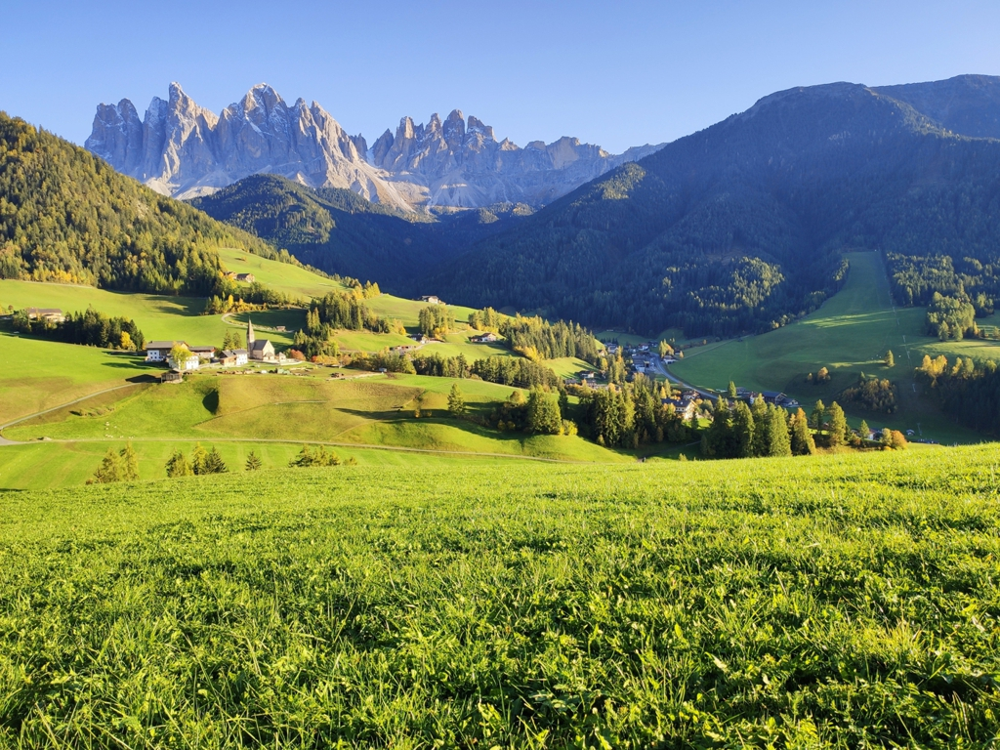

In [12]:
# Choose a random image ID from the list of image IDs
img_id = random.choice(img_ids_subset)

# img_id = '2650631'

print(f"ID: {img_id}")

# Open the image located at the path in the img_path_dict with the key of the current img_id
img_path = src_img_path_dict[img_id]
sample_img = Image.open(img_path)

# Display the image and its depth map
sample_img

**Get style image**

In [13]:
style_dataset_path = Path("/mnt/980_1TB_1/Datasets/style_images/")
style_dataset_path

Path('/mnt/980_1TB_1/Datasets/style_images')

In [14]:
style_img_path = Path(style_dataset_path/"mosaic_4x.jpg")
# style_img_path = Path(style_dataset_path/"dragon-facets_4x.jpg")
# style_img_path = Path(style_dataset_path/"Van_Gogh_Starry_Night_town.jpg")
# style_img_path = Path(style_dataset_path/"S2_crop.jpg")
# style_img_path

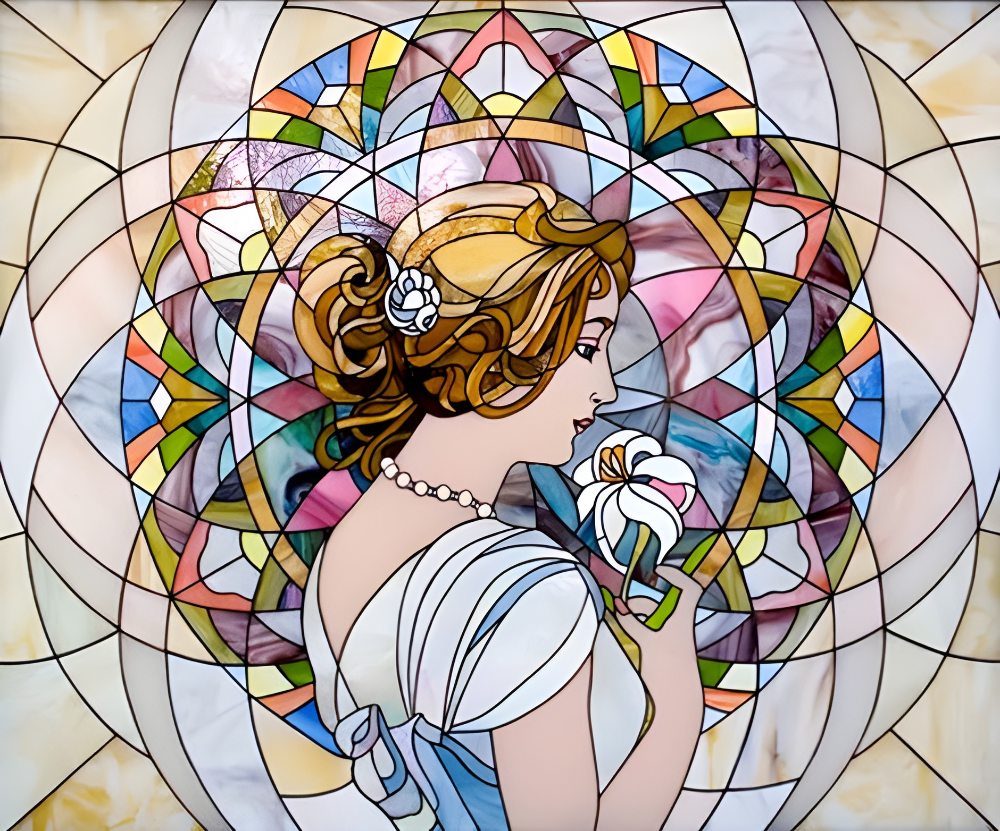

In [15]:
style_img = Image.open(style_img_path).convert("RGB")
style_img

In [16]:
# Check if the MPS (Metal Performance Shaders) for MacOS is available, and if so, set the `device` variable to "mps"
# Otherwise, check if CUDA is available, and if so, set the `device` variable to "cuda"
# If neither MPS nor CUDA are available, set the `device` variable to "cpu"
device = (
    "mps"
    if torch.backends.mps.is_available()
    else "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

# Print the value of the `device` variable
print(device)

cuda


In [17]:
# weight_dtype = torch.float16
weight_dtype = torch.float32

In [18]:
img_tensor = pil_to_tensor(sample_img).to(device=device, dtype=weight_dtype)
img_tensor.shape

torch.Size([1, 3, 768, 1024])

In [22]:
class StyleTransferDataset():
    def __init__(
        self,
        img_ids,
        src_img_path_dict,
        norm_stats,
        size=512,
        center_crop=False,
    ):
        self.img_ids = img_ids
        self.src_img_path_dict = src_img_path_dict
        
        self.size = size
        self.center_crop = center_crop
        
        self.image_transforms = transforms.Compose(
            [
                transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.CenterCrop(size) if center_crop else transforms.RandomCrop(size),
                transforms.ToTensor(),
                transforms.Normalize(*norm_stats)
            ]
        )
        
    def __len__(self):
        return len(self.img_ids)
    
    def __getitem__(self, index):
        
        img_id = self.img_ids[index % len(self.img_ids)]
        
        example = {}
        
        src_img_path = self.src_img_path_dict[img_id]
        src_img = Image.open(src_img_path)
#         example["model_inp"] = self.image_transforms(src_img)
        
        return self.image_transforms(src_img)

In [23]:
imagenet_stats = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]

In [24]:
# train_sz = 296
# train_sz = 384
train_sz = 512
# train_sz = 768

train_dataset = StyleTransferDataset(
    img_ids=img_ids_subset[:-4],
    src_img_path_dict=src_img_path_dict,
    norm_stats=imagenet_stats,
    size=train_sz,
    center_crop=False,
)
valid_dataset = StyleTransferDataset(
    img_ids=img_ids_subset[-4:],
    src_img_path_dict=src_img_path_dict,
    norm_stats=imagenet_stats,
    size=train_sz,
    center_crop=False,
)

In [25]:
len(train_dataset), len(valid_dataset)

(109967, 4)

In [26]:
for data in train_dataset:
    print(data.shape)
    break

torch.Size([3, 512, 512])


In [27]:
# Batch size (per device) for the training dataloader.
bs = 4

train_dataloader = torch.utils.data.DataLoader(train_dataset, 
                                               batch_size=bs, 
                                               shuffle=True, 
                                               num_workers=multiprocessing.cpu_count(), 
                                               pin_memory=True)

valid_dataloader = torch.utils.data.DataLoader(valid_dataset, 
                                               batch_size=bs, 
                                               shuffle=True, 
                                               num_workers=multiprocessing.cpu_count(), 
                                               pin_memory=True)

In [28]:
len(train_dataloader), len(valid_dataloader)

(27492, 1)

In [29]:
for data in train_dataloader:
    print(data.shape)
    break

torch.Size([4, 3, 512, 512])


In [30]:
dls = DataLoaders(train_dataloader, valid_dataloader)

In [31]:
len(dls.train), len(dls.valid)

(27492, 1)

In [32]:
# style_tensor = train_dataset.image_transforms(style_img)
style_tensor = pil_to_tensor(resize_img(style_img, train_dataset.size))
style_tensor = style_tensor.repeat(bs, 1, 1, 1).to(device=device, dtype=weight_dtype)
style_tensor.shape

torch.Size([4, 3, 512, 608])

In [33]:
# Create a directory for the specific checkpoints
checkpoint_dir = Path("./fns_checkpoints/")
checkpoint_dir.mkdir(parents=True, exist_ok=True)

checkpoint_name = f"{src_dataset_path.stem.lower()}-{style_img_path.stem.lower()}-{train_sz}p"
checkpoint_path = Path(checkpoint_dir/f"{checkpoint_name}")
checkpoint_path.mkdir(parents=True, exist_ok=True)

model_path = Path(checkpoint_path/"model.pth")

# Print the checkpoint path
checkpoint_path

Path('fns_checkpoints/pexels_full_768p-mosaic_4x-512p')

In [34]:
class ConvLayer(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride):
        super(ConvLayer, self).__init__()
        reflection_padding = kernel_size // 2
        self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
        self.conv2d = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        out = self.reflection_pad(x)
        out = self.conv2d(out)
        return out

class ResidualBlock(torch.nn.Module):
    """ResidualBlock
    introduced in: https://arxiv.org/abs/1512.03385
    recommended architecture: http://torch.ch/blog/2016/02/04/resnets.html
    """

    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = ConvLayer(channels, channels, kernel_size=3, stride=1)
        self.in1 = torch.nn.InstanceNorm2d(channels, affine=True)
        self.conv2 = ConvLayer(channels, channels, kernel_size=3, stride=1)
        self.in2 = torch.nn.InstanceNorm2d(channels, affine=True)
        self.relu = torch.nn.LeakyReLU()

    def forward(self, x):
        residual = x
        out = self.relu(self.in1(self.conv1(x)))
        out = self.in2(self.conv2(out))
        out = out + residual
        return out

class DownsampleShuffle(torch.nn.Module):
    
    def __init__(self, in_channels, out_channels, downsample=2):
        super(DownsampleShuffle, self).__init__()
        self.conv2d = torch.nn.Conv2d(in_channels, out_channels//(downsample**2), kernel_size=1, stride=1)
        self.relu = torch.nn.ReLU(inplace=True)
        self.pixel_unshuffle = torch.nn.PixelUnshuffle(downsample)

    def forward(self, x):
        return self.pixel_unshuffle(self.relu(self.conv2d(x)))

class UpsampleShuffle(torch.nn.Module):
    
    def __init__(self, in_channels, out_channels, upsample=2):
        super(UpsampleShuffle, self).__init__()
        self.conv2d = torch.nn.Conv2d(in_channels, out_channels*(upsample**2), kernel_size=1, stride=1)
        self.relu = torch.nn.ReLU(inplace=True)
        self.pixel_shuffle = torch.nn.PixelShuffle(upsample)

    def forward(self, x):
        return self.pixel_shuffle(self.relu(self.conv2d(x)))

In [35]:
class TransformerNet(torch.nn.Module):
    def __init__(self, chnls=[32,64,128]):
        super(TransformerNet, self).__init__()
        # Initial convolution layers
        self.conv1 = ConvLayer(3, chnls[0], kernel_size=5, stride=1)
        self.in1 = torch.nn.InstanceNorm2d(chnls[0], affine=True)
        self.conv2 = DownsampleShuffle(chnls[0], chnls[1], downsample=2)
        self.in2 = torch.nn.InstanceNorm2d(chnls[1], affine=True)
        self.conv3 = DownsampleShuffle(chnls[1], chnls[2], downsample=2)
        self.in3 = torch.nn.InstanceNorm2d(chnls[2], affine=True)
        # Residual layers
        self.res1 = ResidualBlock(chnls[2])
        self.res2 = ResidualBlock(chnls[2])
        self.res3 = ResidualBlock(chnls[2])
        self.res4 = ResidualBlock(chnls[2])
        self.res5 = ResidualBlock(chnls[2])
        # Upsampling Layers
        self.deconv1 = UpsampleShuffle(chnls[2]*2, chnls[1], upsample=2)
        self.in4 = torch.nn.InstanceNorm2d(chnls[1], affine=True)
        self.deconv2 = UpsampleShuffle(chnls[1]*2, chnls[0], upsample=2)
        self.in5 = torch.nn.InstanceNorm2d(chnls[0], affine=True)
        self.deconv3 = ConvLayer(chnls[0], 3, kernel_size=5, stride=1)
        
        # Non-linearities
        self.relu = torch.nn.LeakyReLU()
        self.out = torch.nn.Sigmoid()

    def forward(self, X):
        y = self.relu(self.in1(self.conv1(X)))
        d1_y = self.relu(self.in2(self.conv2(y)))
        d2_y = self.relu(self.in3(self.conv3(d1_y)))
        y = self.res1(d2_y)
        y = self.res2(y)
        y = self.res3(y)
        y = self.res4(y)
        y = self.res5(y)
        y = self.relu(self.in4(self.deconv1(torch.cat([d2_y, y], dim=1))))
        y = self.relu(self.in5(self.deconv2(torch.cat([d1_y, y], dim=1))))
        
        y = self.deconv3(y)
        return self.out(y)

In [36]:
style_transfer_model = TransformerNet(chnls=[16,32,64]).to(device)
# style_transfer_model = TransformerNet(chnls=[32,64,128]).to(device)

In [37]:
import torch.nn.init as init

In [38]:
for module in style_transfer_model.modules():
    if type(module) == torch.nn.modules.conv.Conv2d:
        init.kaiming_normal_(list(module.parameters())[0])

last_conv = list(style_transfer_model.children())[-3]
last_conv.conv2d.weight.data.zero_();

In [39]:
from fvcore.nn import FlopCountAnalysis

In [40]:
def get_inp(): yield train_dataset

test_inp = next(get_inp())[0].unsqueeze(dim=0).to(device)
test_inp.shape

torch.Size([1, 3, 512, 512])

In [41]:
flops = FlopCountAnalysis(style_transfer_model, test_inp)
print(f"MFLOPS: {int(flops.total()/1e6)}")

module_flops = {module: int(flops/1e6) for module, flops in flops.by_module().items() if "conv2d" in module}
pd.DataFrame.from_dict(module_flops, orient='index')

MFLOPS: 7393


,0
conv1.conv2d,314
conv2.conv2d,33
conv3.conv2d,33
res1.conv1.conv2d,603
res1.conv2.conv2d,603
res2.conv1.conv2d,603
res2.conv2.conv2d,603
res3.conv1.conv2d,603
res3.conv2.conv2d,603
res4.conv1.conv2d,603


In [42]:
# Total number of training epochs
num_train_epochs = 1
# Total number of training steps to perform.  If provided, overrides num_train_epochs.
max_train_steps = len(img_ids_subset) * num_train_epochs
# Number of updates steps to accumulate before performing a backward/update pass.
gradient_accumulation_steps = 1

In [43]:
# Initial learning rate (after the potential warmup period) to use.
learning_rate = 2e-3

In [44]:
# Use 8-bit Adam for lower memory usage when available
# https://github.com/TimDettmers/bitsandbytes
try:
    import bitsandbytes as bnb
    optimizer_class = bnb.optim.AdamW8bit
except ImportError:
    optimizer_class = torch.optim.AdamW
print(f"Optimizer Class: {optimizer_class.__name__}")

# optimizer = optimizer_class(style_transfer_model.parameters(), lr=learning_rate, eps=1e-2)


===================================BUG REPORT===================================
Welcome to bitsandbytes. For bug reports, please submit your error trace to: https://github.com/TimDettmers/bitsandbytes/issues
For effortless bug reporting copy-paste your error into this form: https://docs.google.com/forms/d/e/1FAIpQLScPB8emS3Thkp66nvqwmjTEgxp8Y9ufuWTzFyr9kJ5AoI47dQ/viewform?usp=sf_link
CUDA SETUP: CUDA runtime path found: /home/innom-dt/mambaforge/envs/pytorch-2-pip/lib/libcudart.so
CUDA SETUP: Highest compute capability among GPUs detected: 7.5
CUDA SETUP: Detected CUDA version 113
CUDA SETUP: Loading binary /home/innom-dt/mambaforge/envs/pytorch-2-pip/lib/python3.10/site-packages/bitsandbytes/libbitsandbytes_cuda113.so...
Optimizer Class: AdamW8bit


In [46]:
from torchvision import models

In [47]:
vgg = models.vgg16(pretrained=True).features
# vgg = models.vgg19(pretrained=True).features

vgg = vgg.to(device=device, dtype=weight_dtype).eval()

for param in vgg.parameters():
    param.requires_grad = False

/home/innom-dt/mambaforge/envs/pytorch-2-pip/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/innom-dt/mambaforge/envs/pytorch-2-pip/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [48]:
def hook_fn(hook, module, inp, out):
    hook.outputs = out

In [49]:
class VGGStyleLoss():
    def __init__(self, vgg, norm_stats, style_tensor, hook_fn, content_weight=1e5, style_weight=1e10):
        fc.store_attr()
        self.hooks = []
        self.feature_layers = []
        self.hook_vgg()
        self.features_style = self.get_features(style_tensor)
        self.gram_style = [self.gram_matrix(y.float()) for y in self.features_style]
        
    def hook_vgg(self):
        layer_type = torch.nn.modules.activation.ReLU
        pool_type = torch.nn.modules.pooling.MaxPool2d

        for i, layer in enumerate(self.vgg):
            if type(layer) == layer_type and type(self.vgg[i+1]) == pool_type:
                self.hooks.append(Hook(layer, self.hook_fn))
                self.feature_layers.append(i)
    
    def get_features(self, inp_tensor):
        with torch.cuda.amp.autocast():
            self.vgg(inp_tensor)
        features = [hook.outputs.float() for hook in self.hooks]
        return features
    
    def gram_matrix(self, y):
        (b, ch, h, w) = y.size()
        features = y.view(b, ch, w * h).float()
        gram = torch.einsum('bfs, bgs -> bfg', features, features) / (ch * h * w)
        return gram
    
    def __call__(self, x, y):
        features_y = self.get_features(transforms.Normalize(*self.norm_stats)(y.float()))
        features_x = self.get_features(x.float())
        
        content_loss = self.content_weight * F.mse_loss(features_y[1], features_x[1])
        
        style_loss = 0.
        n_batch = len(x)
        for ft_y, gm_s in zip(features_y, self.gram_style):
            gm_y = self.gram_matrix(ft_y)
            style_loss += F.mse_loss(gm_y.float(), gm_s[:n_batch, :, :].float())
        style_loss *= self.style_weight
        
        return content_loss + style_loss

In [50]:
vgg_style_loss = VGGStyleLoss(vgg, imagenet_stats, style_tensor, hook_fn)
vgg_style_loss.feature_layers

[3, 8, 15, 22, 29]

In [51]:
class StyleOptCB(MixedPrecision):
    def predict(self, learn): 
        with torch.cuda.amp.autocast():
            learn.preds = learn.model(learn.batch)
        learn.preds = learn.preds.float()
        
    def get_loss(self, learn): 
        self.autocast.__exit__(None, None, None)
        learn.loss = learn.loss_func(learn.batch.float(), learn.preds.float())
    
    def after_loss(self, learn):
        if learn.loss.detach().isnan() or learn.loss.detach().isinf(): 
            print("Loss out of bounds")
            raise CancelFitException()

In [52]:
class ImageCheckpointCB(Callback):
    def __init__(self, cp_int, cp_path, img_tensor):
        fc.store_attr()
    def after_loss(self, learn):
        if learn.iter != 0 and learn.iter%self.cp_int == 0:
            with torch.no_grad():
                pred = learn.model(img_tensor)
            test_img = tensor_to_pil(pred.squeeze())
            file_name = f"epoch-{learn.epoch}-batch-{learn.iter}.png"
            test_img.save(self.cp_path/file_name, fmt="PNG")

In [53]:
class ModelCheckpointCB(Callback):
    def __init__(self, cp_int, cp_path):
        fc.store_attr()
    def after_loss(self, learn):
        if learn.iter != 0 and learn.iter%self.cp_int == 0:
            file_name = f"model-epoch-{learn.epoch}-batch-{learn.iter}.pth"
            torch.save(learn.model.state_dict(), Path(self.cp_path/file_name))

In [54]:
checkpoint_interval = 500
img_checkpoint_cb = ImageCheckpointCB(checkpoint_interval, checkpoint_path, img_tensor)
model_checkpoint_cb = ModelCheckpointCB(checkpoint_interval, checkpoint_path)

In [55]:
opt_func = partial(optimizer_class, eps=1e-2)

In [56]:
tmax = num_train_epochs * len(dls.train)
sched = partial(lr_scheduler.OneCycleLR, max_lr=learning_rate, total_steps=tmax)

cbs = [StyleOptCB(), DeviceCB(), ProgressCB(plot=True), img_checkpoint_cb, model_checkpoint_cb]
learn = Learner(style_transfer_model, dls, vgg_style_loss, lr=learning_rate, cbs=cbs, opt_func=opt_func)

In [57]:
learn.fit(num_train_epochs)

In [59]:
weight_dtype = torch.float16

In [60]:
style_transfer_model.to(device=device, dtype=weight_dtype);
style_transfer_model.eval();

In [96]:
infer_sz = 512

ID: 597039
New Dimensions: (744, 512)


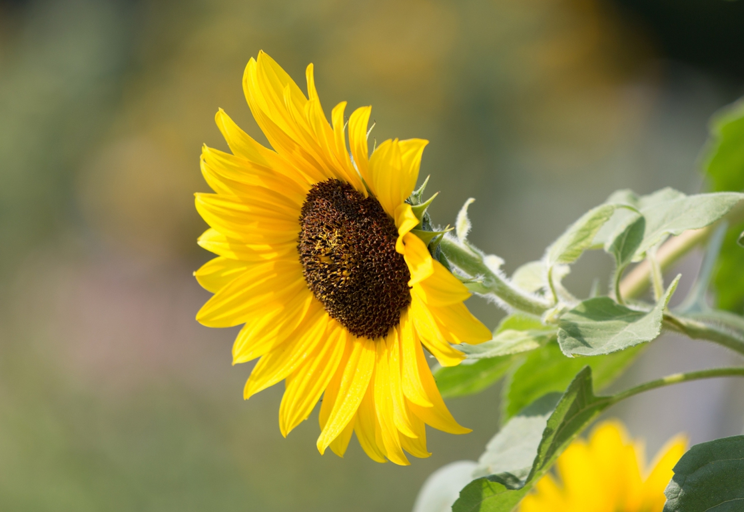

In [97]:
# Choose a random image ID from the list of image IDs
img_id = random.choice(img_ids_subset)

img_id = "597039"

print(f"ID: {img_id}")

# Open the image located at the path in the img_path_dict with the key of the current img_id
img_path = src_img_path_dict[img_id]
sample_img = Image.open(img_path)

sample_img = resize_img(sample_img, target_sz=infer_sz, divisor=8)

# Print the dimensions of the resized image
print(f"New Dimensions: {sample_img.size}")

# Display the image and its depth map
sample_img

In [98]:
img_tensor = pil_to_tensor(sample_img).to(device=device, dtype=weight_dtype)
img_tensor.shape

torch.Size([1, 3, 512, 744])

In [100]:
with torch.no_grad():
    pred = style_transfer_model(img_tensor)
pred.shape

torch.Size([1, 3, 512, 744])

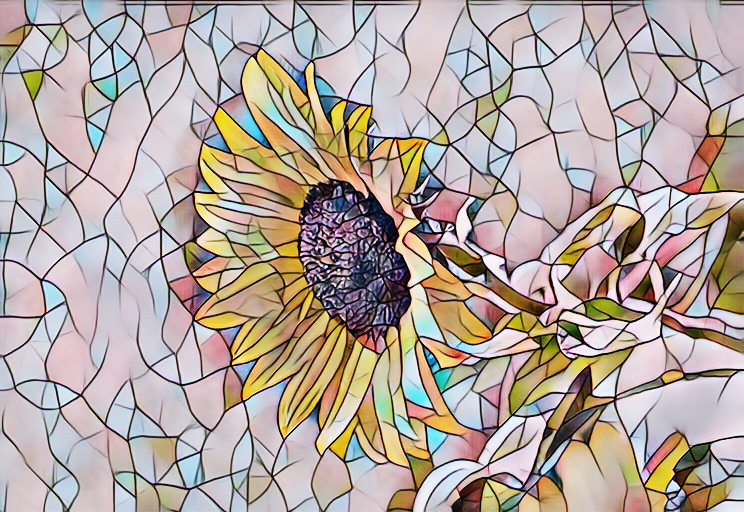

In [101]:
tensor_to_pil(pred.squeeze())

In [104]:
from cjm_pil_utils.core import stack_imgs

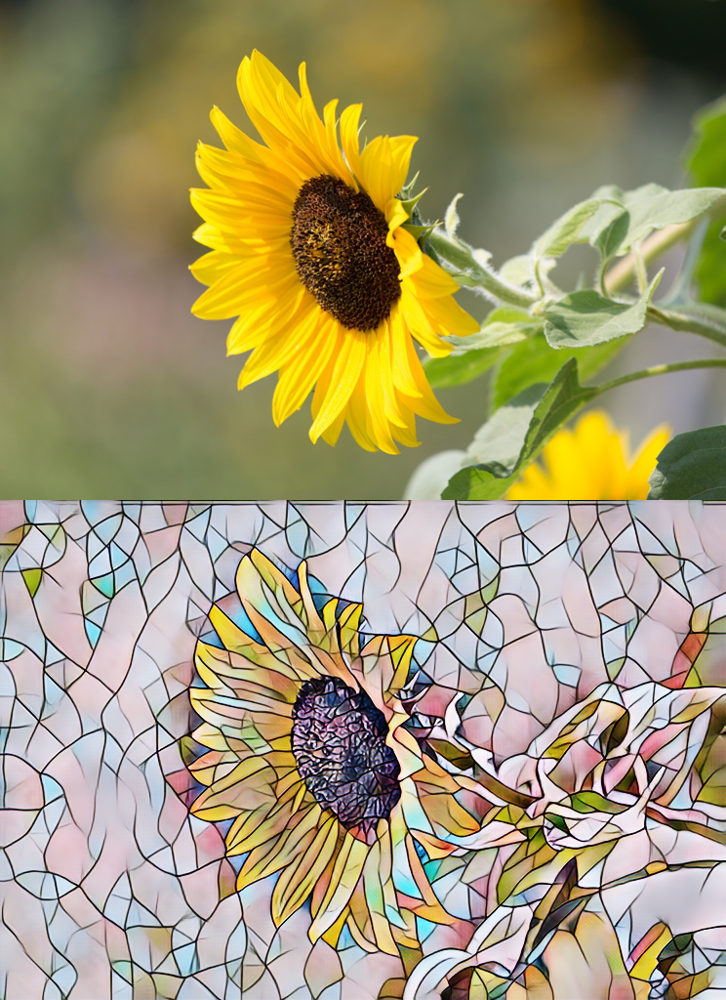

In [106]:
stack_imgs([sample_img, tensor_to_pil(pred.squeeze())])